# Intronic mapping test - Normalization
Data should be normalized in order to compare cells because counts are affected by sequencing depth, gene length and cell cycle phase.
<br>

Standard:
Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.
<br>


<div class="alert alert-warning">
    
**What the third section (Normalization) does**
    
This section normalizes the data based on sequencing depth and gene length so the cells are comparable. Subsequently dimensional reduction and clustering are performed to visualize samples separately. The section contains the following important subsections:

* Normalization <br>
* Dimensional reduction <br>
* Marker genes and property annotation visualizations <br>

</div> 

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#Hey
hey_98_filtered='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_intronic_region_testing/data/hey_98_filtered_1.h5ad'
hey_98_intron_filtered='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_intronic_region_testing/data/hey_98_intron_filtered_1.h5ad'

#Zhong
zhong_98_filtered='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_intronic_region_testing/data/zhong_98_filtered_1.h5ad'
zhong_98_intron_filtered='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_intronic_region_testing/data/zhong_98_intron_filtered_1.h5ad'


In [4]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_intronic_region_testing/')

FileNotFoundError: [Errno 2] No such file or directory: '/home/hers_basak/jjiang/jack/outputs/deliverables/0_intronic_region_testing/'

In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_intronic_region_testing'

In [6]:
!ls data

hey_98_filtered_1.h5ad		 zhong_98_filtered_1.h5ad
hey_98_intron_filtered_1.h5ad	 zhong_98_intron_filtered_1.h5ad
hey_98_intron_preprocessed.h5ad  zhong_98_intron_preprocessed.h5ad
hey_98_preprocessed.h5ad	 zhong_98_preprocessed.h5ad


In [5]:
files = [hey_98_filtered, hey_98_intron_filtered, zhong_98_filtered, zhong_98_intron_filtered]

In [6]:
names = [name.split('_filtered')[0].split('/data/')[1] for name in files ]
print(names)

['hey_98', 'hey_98_intron', 'zhong_98', 'zhong_98_intron']


In [7]:
object_names_filtered=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_filtered.append("adata"+"_"+names[i]+"_"+"filtered_1")
    locals()[object_names_filtered[i]] = sc.read(files[i]) 
    print(object_names_filtered[i],' is loaded')

adata_hey_98_filtered_1  is loaded
adata_hey_98_intron_filtered_1  is loaded
adata_zhong_98_filtered_1  is loaded
adata_zhong_98_intron_filtered_1  is loaded


In [9]:
adata_hey_98_intron_filtered_1

AnnData object with n_obs × n_vars = 5754 × 21941
    obs: 'species', 'cngb_sample_id', 'sample_group', 'atlas', 'reference', 'intronic_mapping', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'

## Normalization

In [10]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]].X)

  (0, 17)	1.0
  (0, 78)	1.0
  (0, 87)	1.0
  (0, 97)	1.0
  (0, 112)	1.0
  (0, 143)	1.0
  (0, 146)	1.0
  (0, 163)	3.0
  (0, 208)	1.0
  (0, 211)	1.0
  (0, 306)	1.0
  (0, 321)	2.0
  (0, 357)	2.0
  (0, 382)	1.0
  (0, 418)	1.0
  (0, 449)	1.0
  (0, 455)	1.0
  (0, 471)	1.0
  (0, 474)	1.0
  (0, 515)	1.0
  (0, 595)	1.0
  (0, 605)	1.0
  (0, 648)	1.0
  (0, 655)	4.0
  (0, 724)	1.0
  :	:
  (4128, 17900)	1.0
  (4128, 17906)	2.0
  (4128, 17927)	1.0
  (4128, 17943)	1.0
  (4128, 17970)	1.0
  (4128, 18001)	1.0
  (4128, 18027)	1.0
  (4128, 18030)	1.0
  (4128, 18046)	2.0
  (4128, 18058)	1.0
  (4128, 18065)	1.0
  (4128, 18066)	1.0
  (4128, 18077)	1.0
  (4128, 18117)	1.0
  (4128, 18134)	1.0
  (4128, 18195)	1.0
  (4128, 18196)	1.0
  (4128, 18266)	1.0
  (4128, 18269)	1.0
  (4128, 18279)	5.0
  (4128, 18288)	2.0
  (4128, 18389)	1.0
  (4128, 18471)	3.0
  (4128, 18543)	3.0
  (4128, 18559)	1.0
  (0, 0)	3.0
  (0, 2)	1.0
  (0, 14)	1.0
  (0, 17)	7.0
  (0, 41)	1.0
  (0, 50)	1.0
  (0, 78)	1.0
  (0, 81)	1.0
  (0, 97)	1.0

In [11]:
## Normalize and Logarithmize
for i in range(numberobj):
    sc.pp.normalize_total(locals()[object_names_filtered[i]], key_added='total_counts_norm')
    locals()[object_names_filtered[i]].raw = locals()[object_names_filtered[i]].copy()
    sc.pp.log1p(locals()[object_names_filtered[i]])
    print(object_names_filtered[i], ' has been normalized and logarithmized')

adata_hey_98_filtered_1  has been normalized and logarithmized
adata_hey_98_intron_filtered_1  has been normalized and logarithmized
adata_zhong_98_filtered_1  has been normalized and logarithmized
adata_zhong_98_intron_filtered_1  has been normalized and logarithmized


In [20]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]].X)

  (0, 3)	0.16487083
  (0, 4)	0.09038182
  (0, 8)	0.09038182
  (0, 10)	0.4089504
  (0, 11)	0.09038182
  (0, 15)	0.16487083
  (0, 20)	0.16487083
  (0, 21)	0.09038182
  (0, 26)	0.09038182
  (0, 27)	0.4089504
  (0, 28)	0.22780389
  (0, 31)	0.22780389
  (0, 34)	0.22780389
  (0, 35)	0.09038182
  (0, 36)	0.3294081
  (0, 41)	0.09038182
  (0, 48)	0.16487083
  (0, 53)	0.22780389
  (0, 63)	0.09038182
  (0, 71)	0.37138662
  (0, 75)	0.09038182
  (0, 76)	0.09038182
  (0, 78)	0.16487083
  (0, 80)	0.09038182
  (0, 81)	0.09038182
  :	:
  (4197, 17534)	0.56538606
  (4197, 17536)	0.56538606
  (4197, 17583)	0.56538606
  (4197, 17587)	0.56538606
  (4197, 17615)	0.56538606
  (4197, 17641)	0.56538606
  (4197, 17652)	0.79079497
  (4197, 17675)	0.56538606
  (4197, 17721)	0.56538606
  (4197, 17751)	0.56538606
  (4197, 17754)	0.56538606
  (4197, 17760)	0.79079497
  (4197, 17780)	0.56538606
  (4197, 17783)	0.56538606
  (4197, 17801)	0.56538606
  (4197, 17809)	0.56538606
  (4197, 17813)	0.79079497
  (4197, 17820)	

### Identify highly-variable genes
This step is important to choose the feature that will be used for dimensionality reduction ()

In [12]:
for i in range(numberobj): 
    sc.pp.highly_variable_genes(locals()[object_names_filtered[i]], min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat') #seurat_v3 is giving an error
    print('worked')

worked
worked
worked
worked


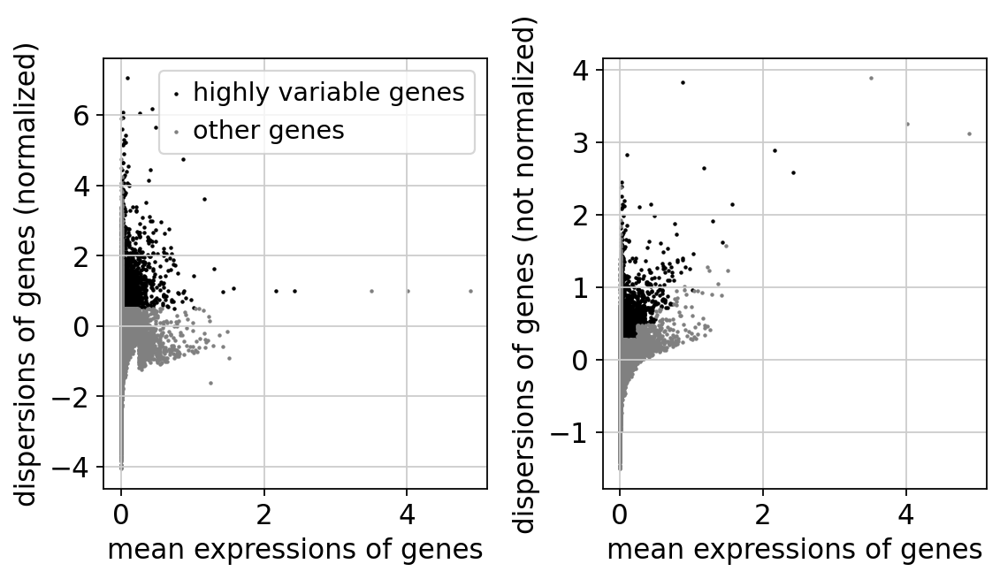

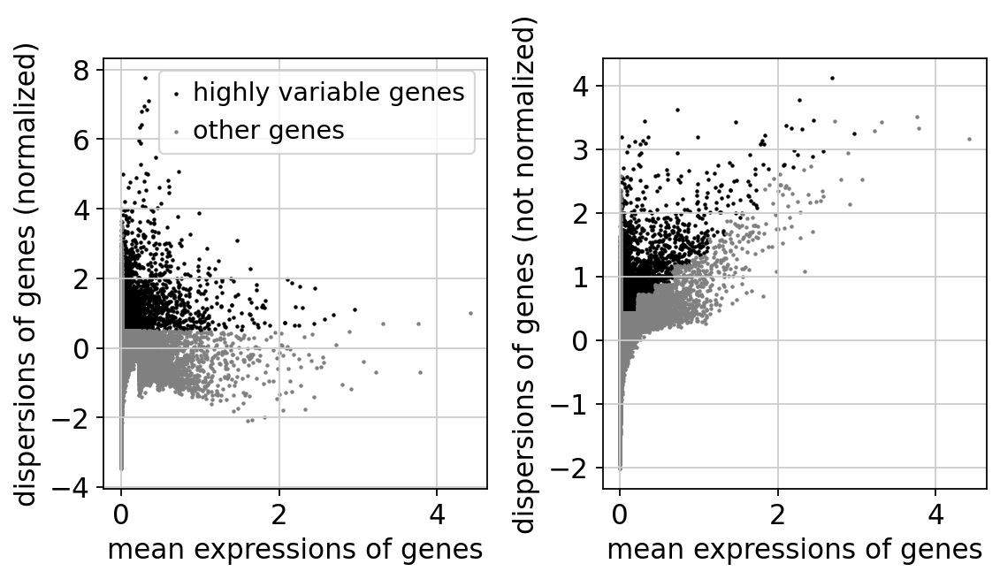

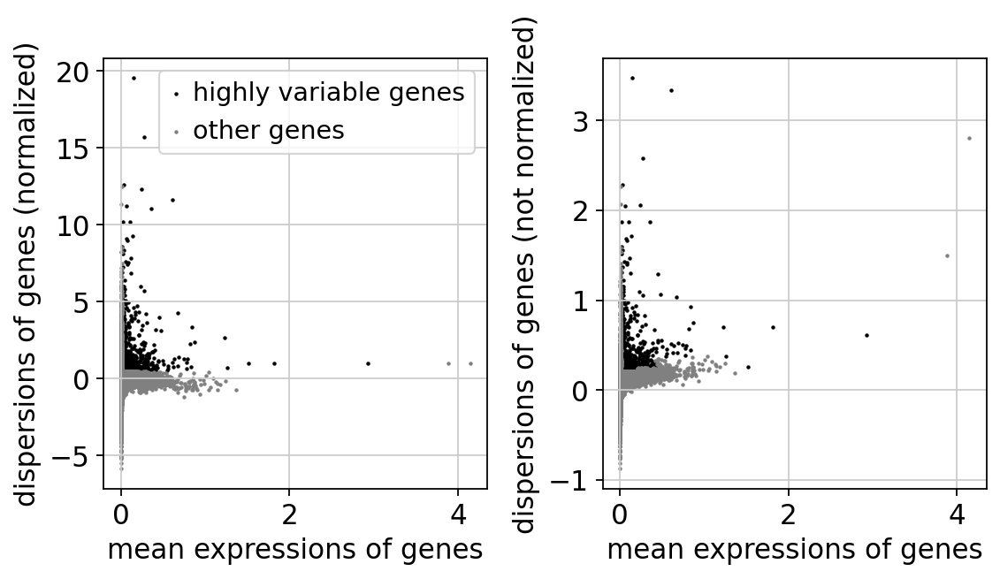

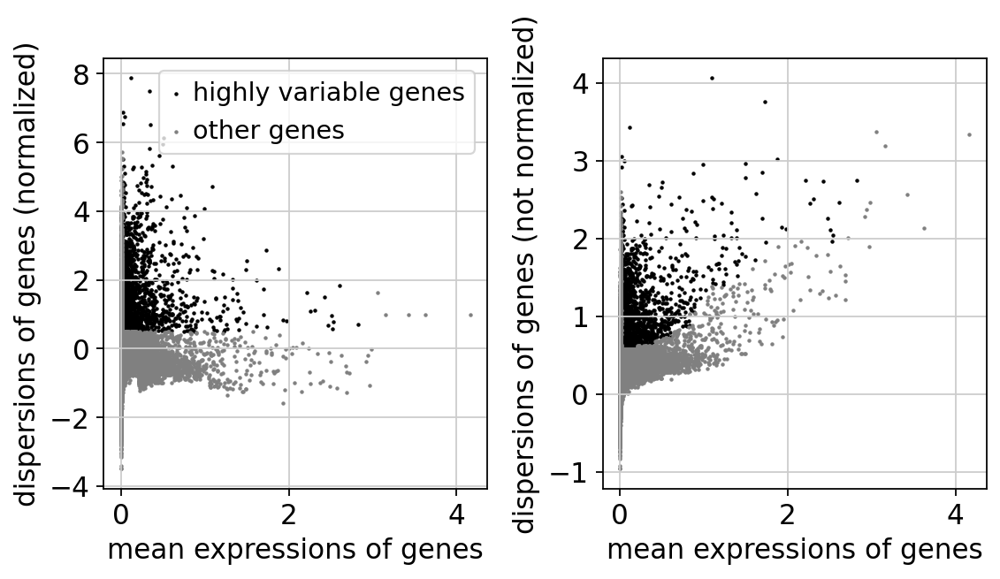

In [13]:
for i in range(numberobj): 
    sc.pl.highly_variable_genes(locals()[object_names_filtered[i]])

### regress and scale
We will compare data regressed for the number of counts and scaled to unprocessed data. It is better to do the least possible. This also saves from memory and disk space. Still, if the number of counts influence the embedding, we need to correct for this \
Note: You could skip filtering for highly variable genes only if you dont need to regress and scale
https://github.com/theislab/single-cell-tutorial/issues/35

In [14]:
for i in range(numberobj):
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]].copy()
    locals()[object_names_filtered[i]+"_reg"].raw = locals()[object_names_filtered[i]+"_reg"]
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]+"_reg"][:, locals()[object_names_filtered[i]+"_reg"].var['highly_variable']]
    sc.pp.regress_out(locals()[object_names_filtered[i]+"_reg"], ['total_counts']) # previously, we regreesed 'n_counts_filtered','percent_mito'
    sc.pp.scale(locals()[object_names_filtered[i]+"_reg"], max_value=10)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [15]:
object_names_reg = list()
numberobj = len(files)
for i in range(numberobj):
    object_names_reg.append(object_names_filtered[i]+"_reg")

In [16]:
object_names_reg

['adata_hey_98_filtered_1_reg',
 'adata_hey_98_intron_filtered_1_reg',
 'adata_zhong_98_filtered_1_reg',
 'adata_zhong_98_intron_filtered_1_reg']

# Dimensional Reduction

In [17]:
#To make reproducible plots
np.random.seed(41)

### Principal component analysis
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [18]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_filtered[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

hey_98


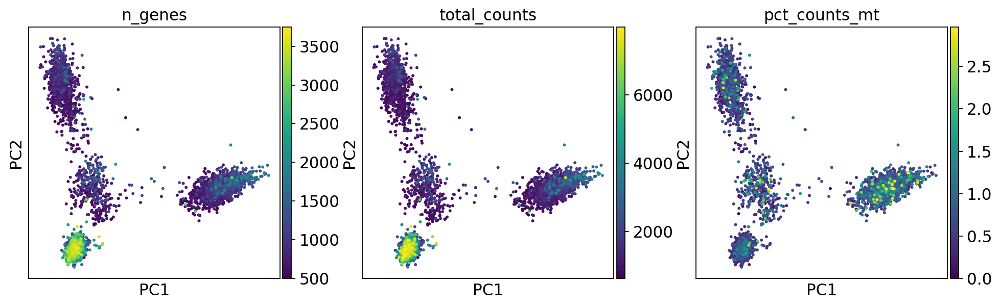

hey_98_intron


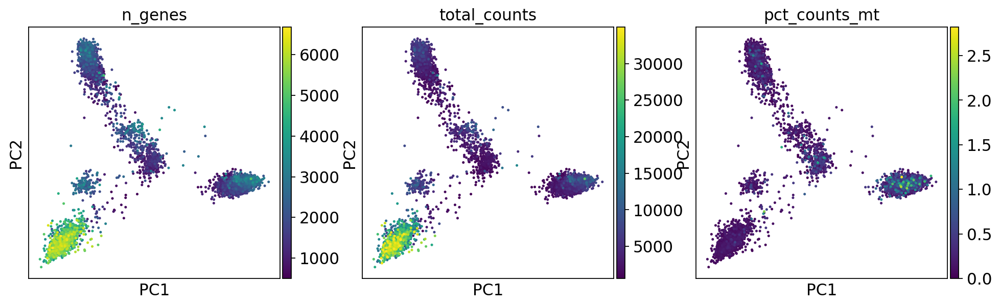

zhong_98


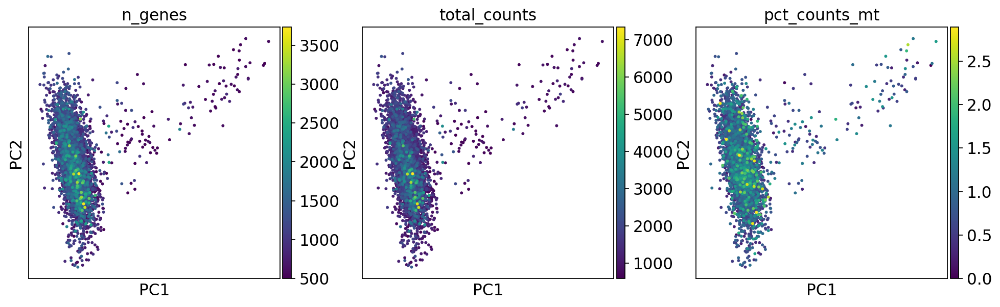

zhong_98_intron


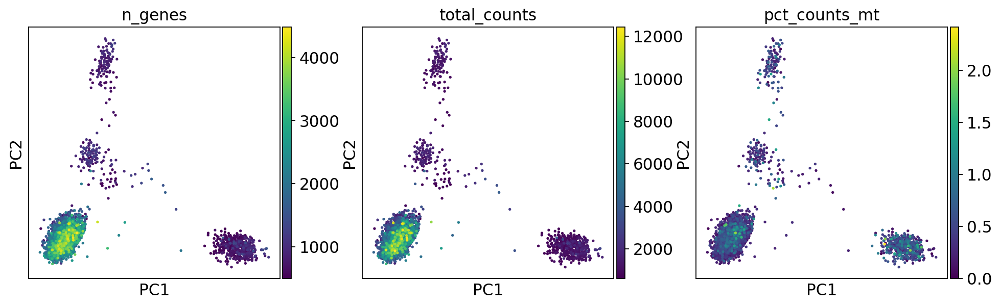

In [19]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_filtered[i]+"_pca.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


In [20]:
!ls figures/

pca_adata_hey_98_filtered_1_pca.pdf
pca_adata_hey_98_intron_filtered_1_pca.pdf
pca_adata_zhong_98_filtered_1_pca.pdf
pca_adata_zhong_98_intron_filtered_1_pca.pdf


In [21]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

hey_98 _reg


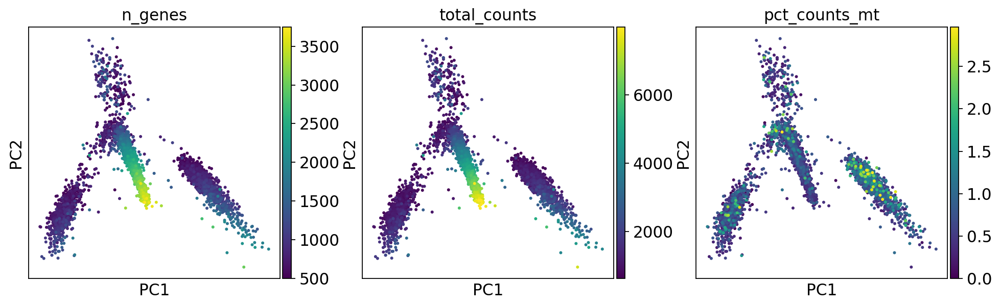

hey_98_intron _reg


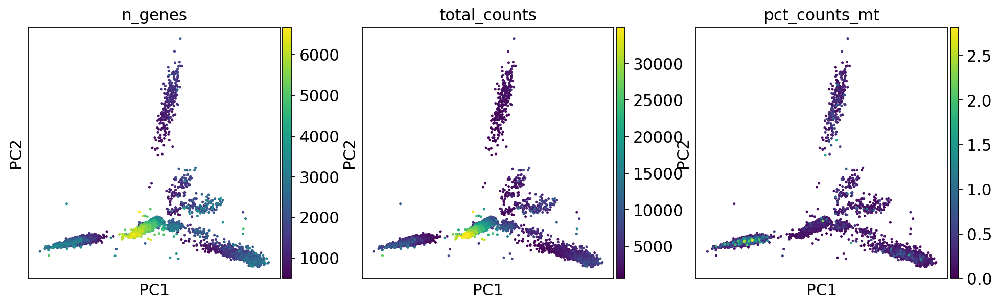

zhong_98 _reg


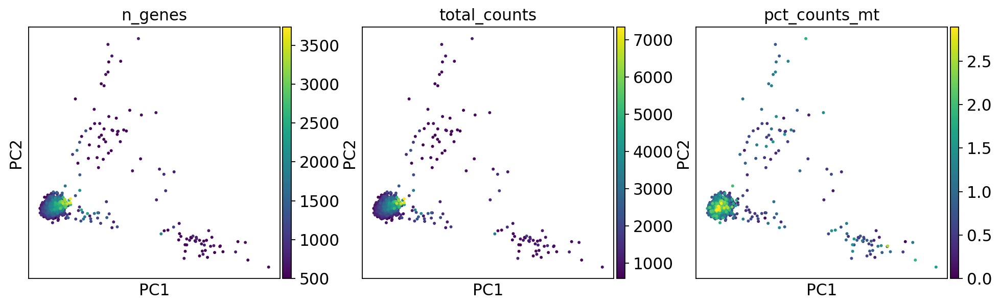

zhong_98_intron _reg


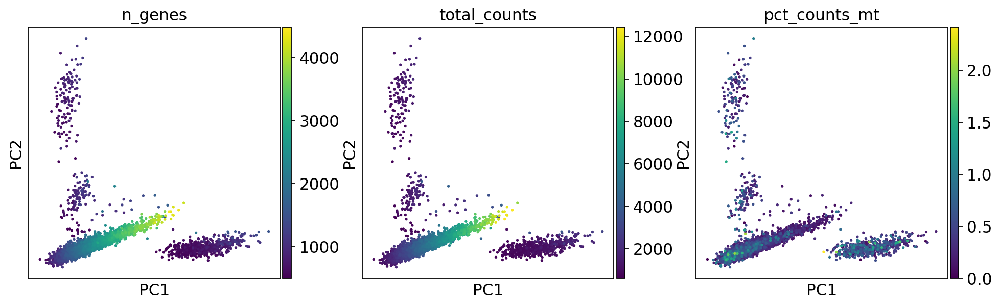

In [22]:
for i in range(numberobj):
    print(names[i],'_reg')
    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_pca.pdf")

**Visualizing cells with marker genes:**<br>
Gfap: Astrocytes <br>
Plp1: myelin proteolipid protein, oligodendritic glial sheaths<br>
Rbfox3: post-mitotic neurons<br>
Gad1: GABAergic neuronal marker (extrasynaptic and metabolic purposes)<br>
Gad2: GABAergic neuronal marker (regulate vesicular pool for release)<br>
Slc17a6: glutamatergic neurons (with Th colocalize VTA)<br>
Th: Dopaminergic neurons<br>
Pecam1: Endothelial cells<br>
P2ry12: Microglia<br>

hey_98


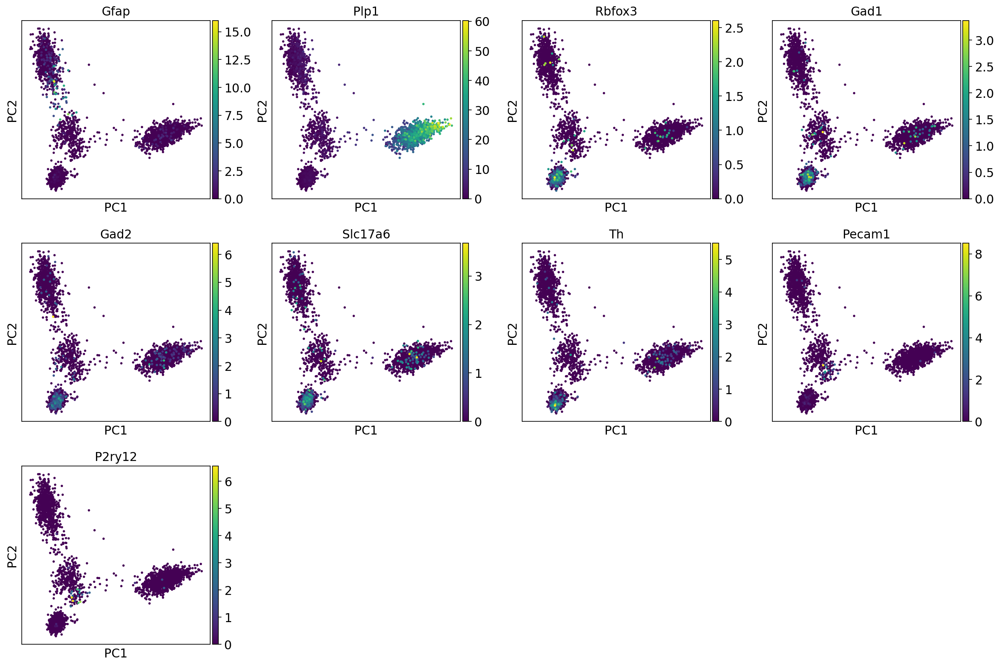

hey_98_intron


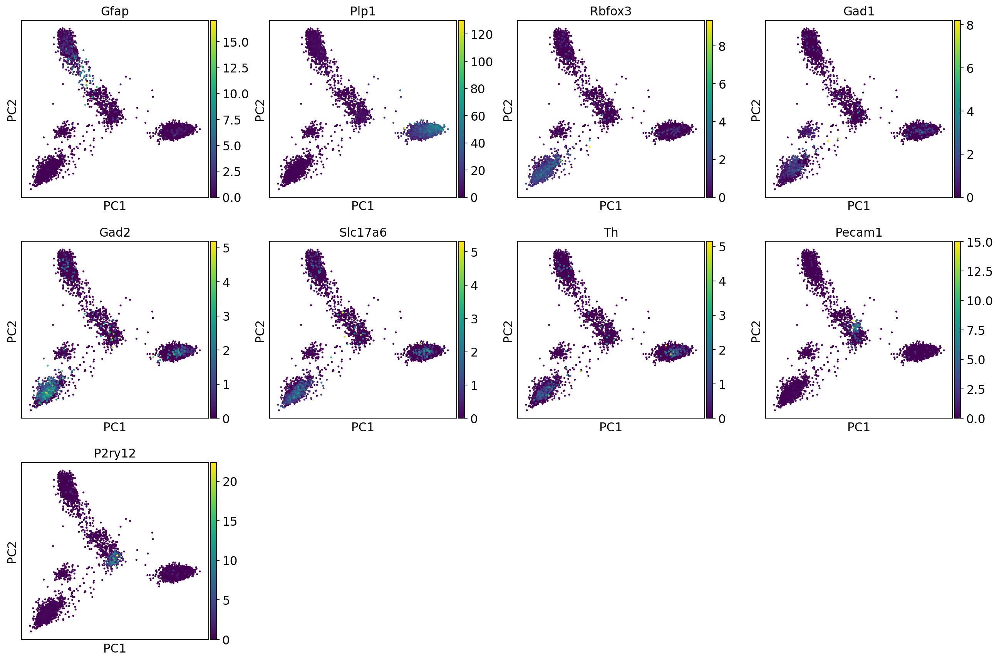

zhong_98


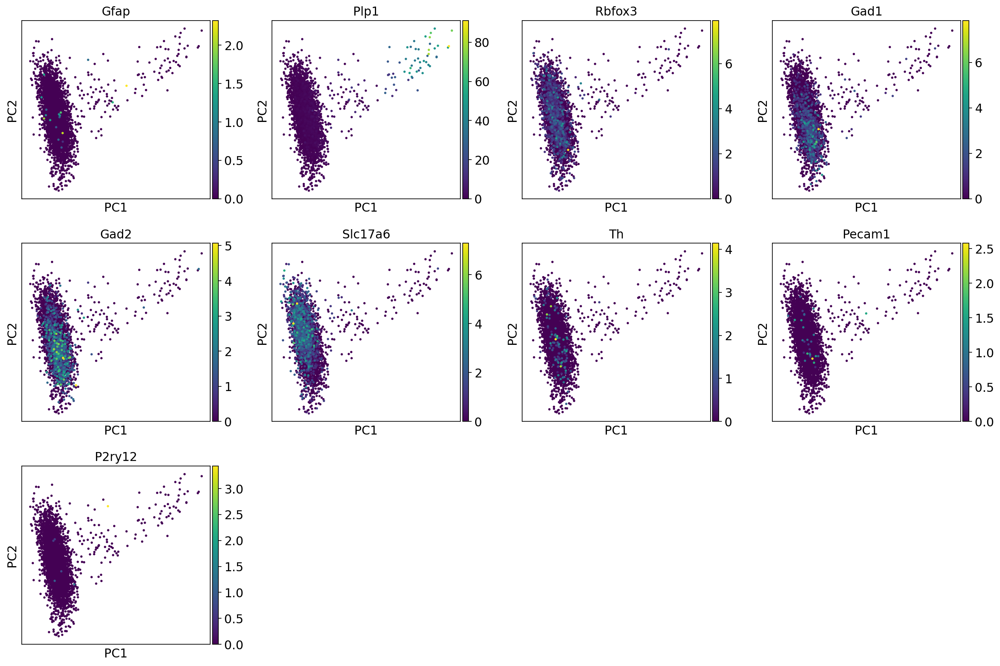

zhong_98_intron


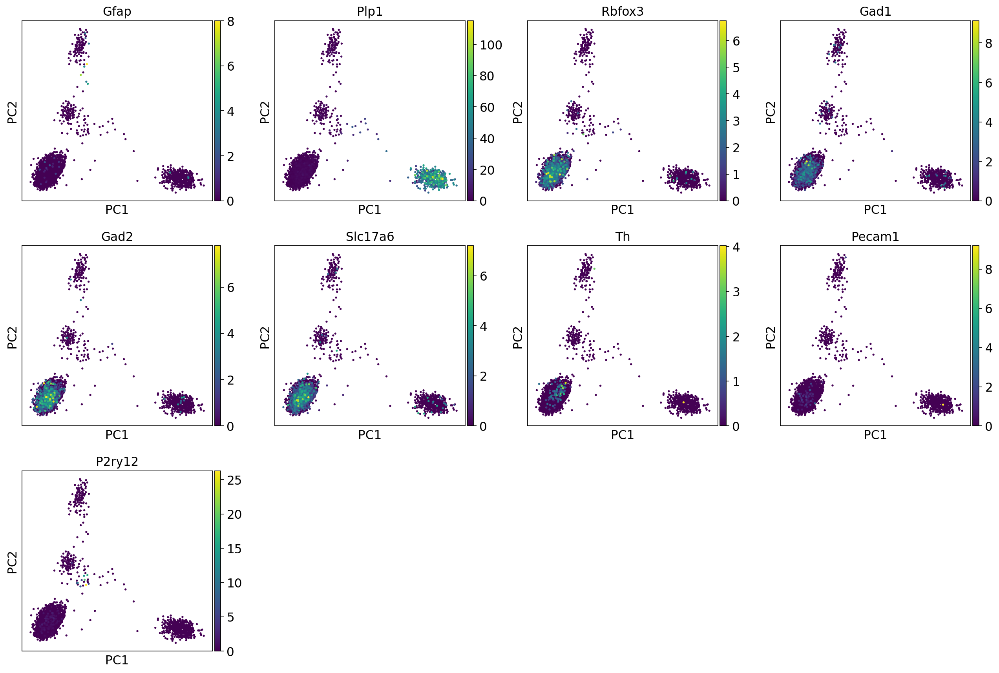

In [23]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1','TMEM119'], 
                save = "_"+object_names_filtered[i]+"_pca_markers.pdf") # title =object_names[i],
#        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th','Pecam1','P2ry12' ], 
                save = "_"+object_names_filtered[i]+"_pca_markers.pdf") #title =object_names_reg[i], 
#        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names_reg[i], 


hey_98 _reg


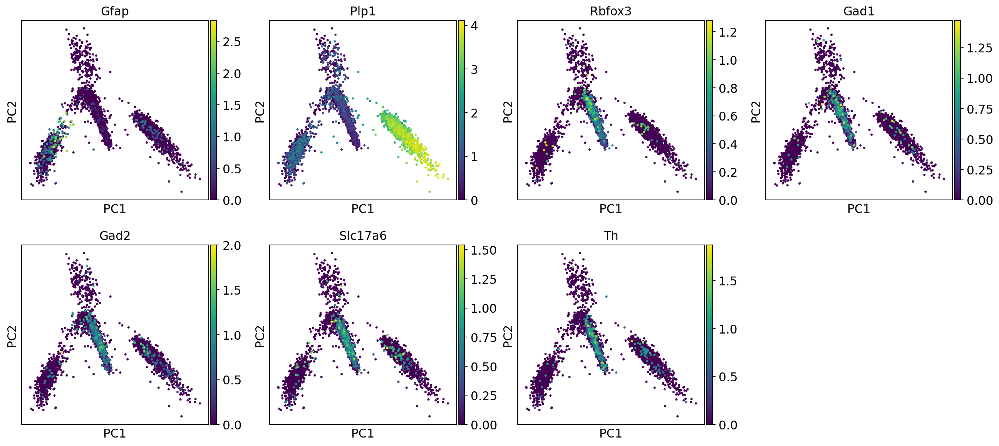

hey_98_intron _reg


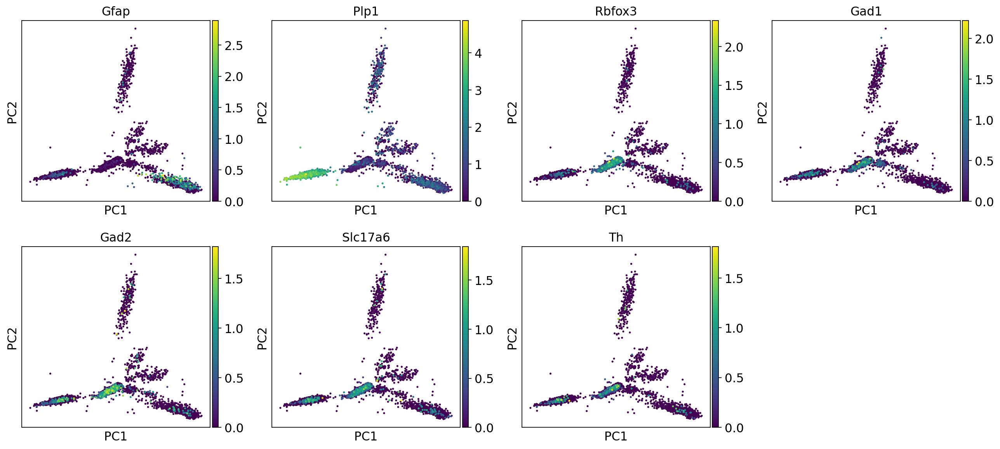

zhong_98 _reg


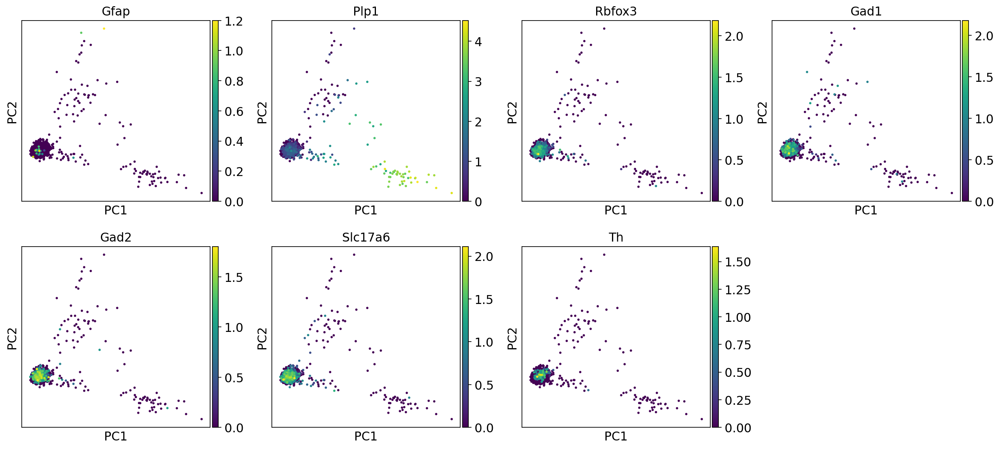

zhong_98_intron _reg


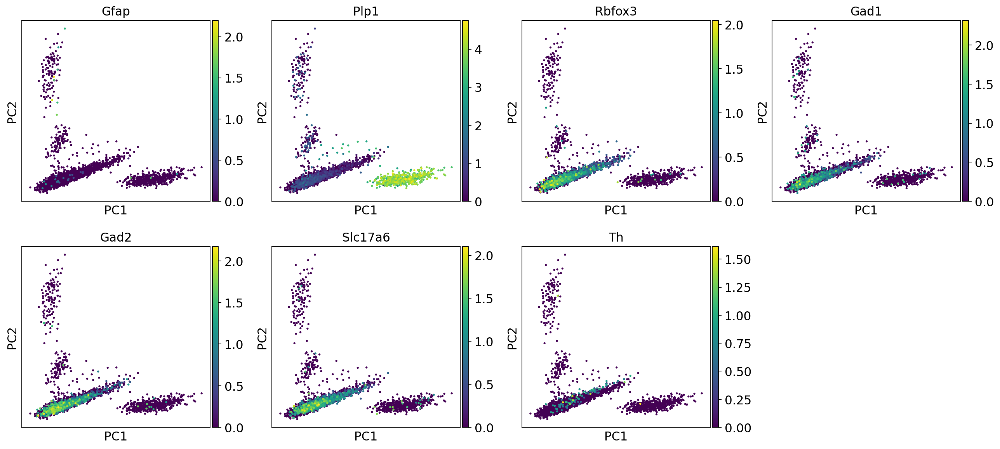

In [24]:
for i in range(numberobj):
    print(names[i], '_reg')
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'], 
                save = "_"+object_names_filtered[i]+"_pca_markers.pdf") # title =object_names[i],
#        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
#        sc.pl.pca(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th'], 
#                save = "_"+object_names_filtered[i]+"_metrics_2.pdf") #title =object_names_reg[i], 
        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], 
                save = "_"+object_names_reg[i]+"_pca_markers.pdf") #title =object_names_reg[i], 


Seems like taking only highly variable genes tends to cluster everything together -> maybe due to outliers

In [27]:
!ls figures/pca

pca_adata_hey_98_filtered_1_pca_markers.pdf
pca_adata_hey_98_filtered_1_pca.pdf
pca_adata_hey_98_filtered_1_reg_pca_markers.pdf
pca_adata_hey_98_filtered_1_reg_pca.pdf
pca_adata_hey_98_intron_filtered_1_pca_markers.pdf
pca_adata_hey_98_intron_filtered_1_pca.pdf
pca_adata_hey_98_intron_filtered_1_reg_pca_markers.pdf
pca_adata_hey_98_intron_filtered_1_reg_pca.pdf
pca_adata_zhong_98_filtered_1_pca_markers.pdf
pca_adata_zhong_98_filtered_1_pca.pdf
pca_adata_zhong_98_filtered_1_reg_pca_markers.pdf
pca_adata_zhong_98_filtered_1_reg_pca.pdf
pca_adata_zhong_98_intron_filtered_1_pca_markers.pdf
pca_adata_zhong_98_intron_filtered_1_pca.pdf
pca_adata_zhong_98_intron_filtered_1_reg_pca_markers.pdf
pca_adata_zhong_98_intron_filtered_1_reg_pca.pdf


In [30]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]])

AnnData object with n_obs × n_vars = 4129 × 2980
    obs: 'species', 'cngb_sample_id', 'sample_group', 'atlas', 'reference', 'intronic_mapping', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
AnnData object with n_obs × n_vars = 5754 × 3604
    obs: 'species', 'cngb_sample_id', 'sample_group', 'atlas', 'reference', 'intronic_mapping', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 

### UMAP

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. \
We will run the following for quick analyses. Later, we will use some metrics to fing out the best dimensionality reduction parameters for UMAP and t-SNE. This is best done on merged datasets

In [32]:
 for i in range(numberobj):
    nn = int(np.sqrt(len(locals()[object_names_filtered[i]])/2))
    print(nn)

45
53
45
50


In [ ]:
nn= [45,53,45,50] #default 15
for i in range(numberobj):
    sc.pp.neighbors(locals()[object_names_filtered[i]], n_neighbors=nn[i], n_pcs=40)
    sc.pp.neighbors(locals()[object_names_reg[i]], n_neighbors=nn[i], n_pcs=40)
    sc.tl.umap(locals()[object_names_filtered[i]])
    sc.tl.umap(locals()[object_names_reg[i]])

In [ ]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=True, s=25
           ,save = "_"+object_names_filtered[i]+"_umap_n"+str(nn[i])+".pdf")

hey_93 _reg


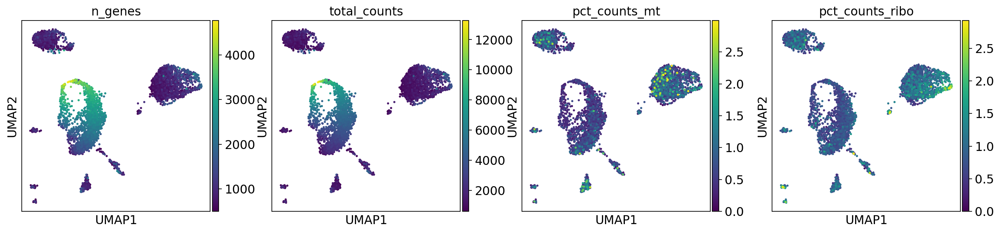

hey_98 _reg


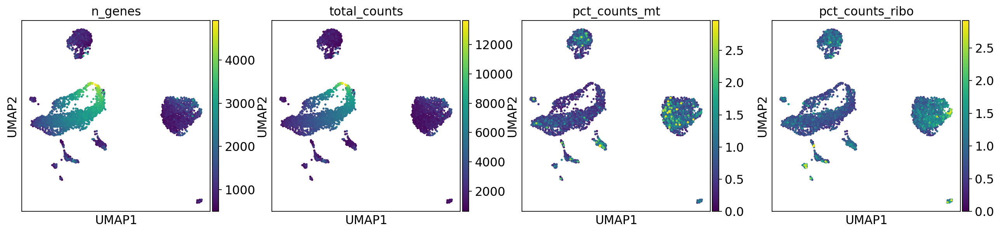

zhong_93 _reg


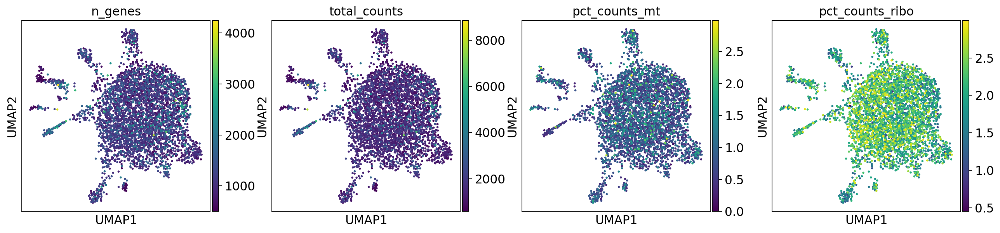

zhong_98 _reg


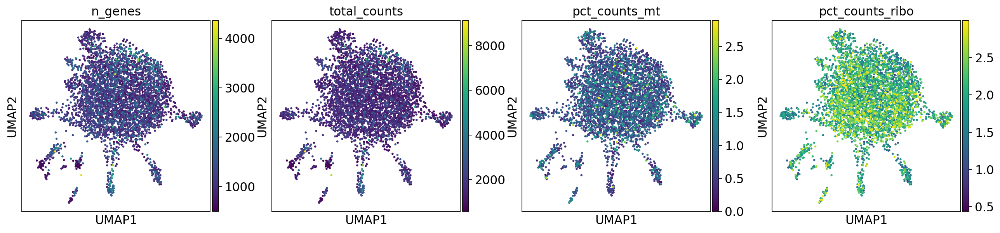

In [105]:
for i in range(numberobj):
    print(names[i],'_reg')
    sc.pl.umap(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=True, s=25
              ,save = "_"+object_names_reg[i]+"_umap_n"+str(nn)+".pdf")

### Plot with marker genes

hey_93


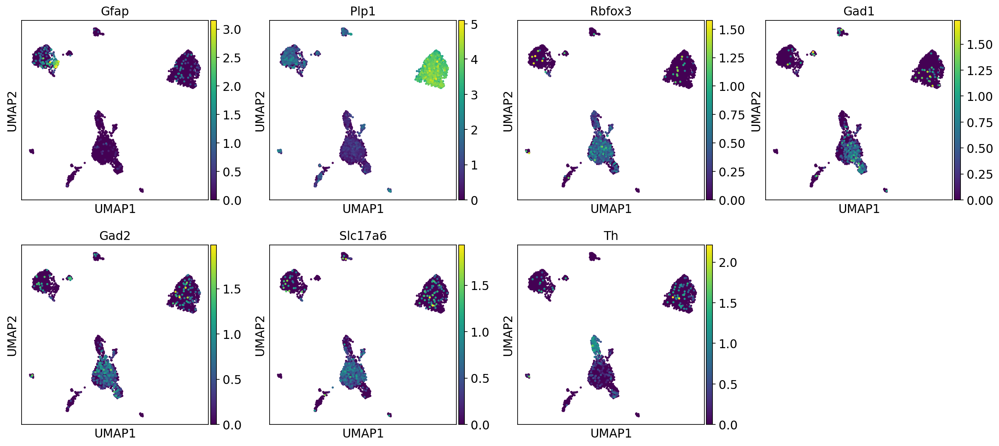

hey_98


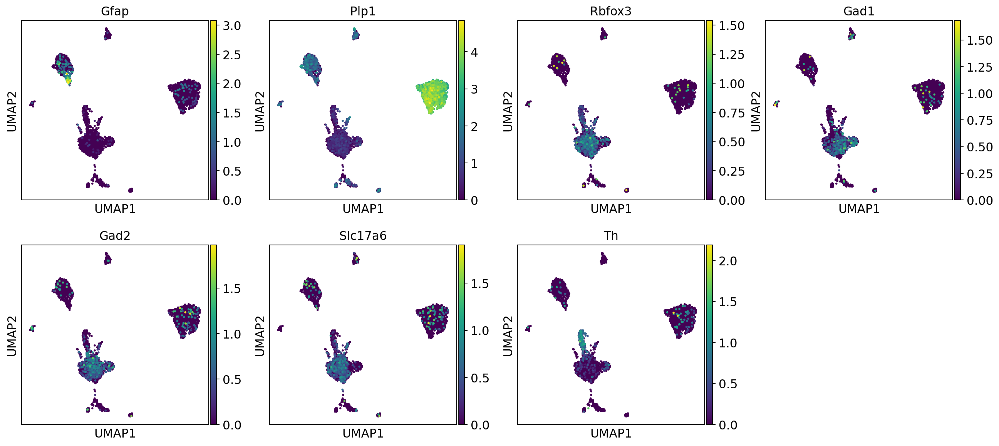

zhong_93


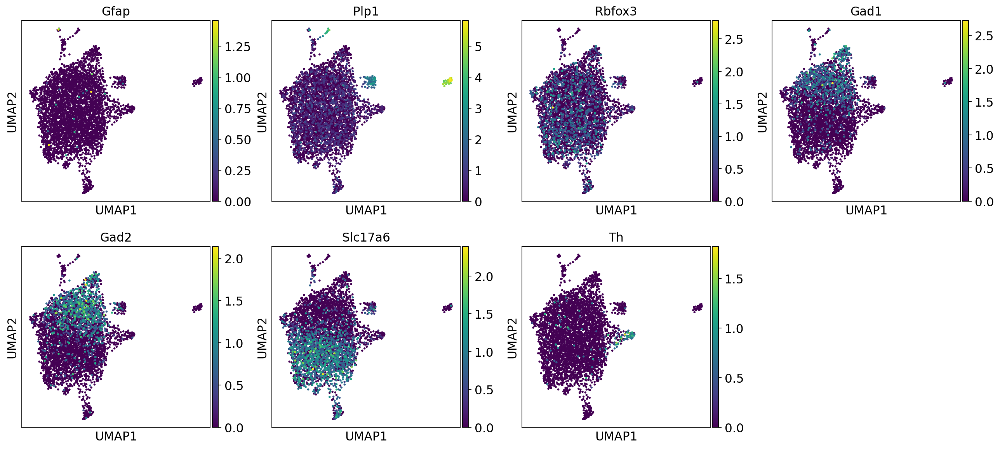

zhong_98


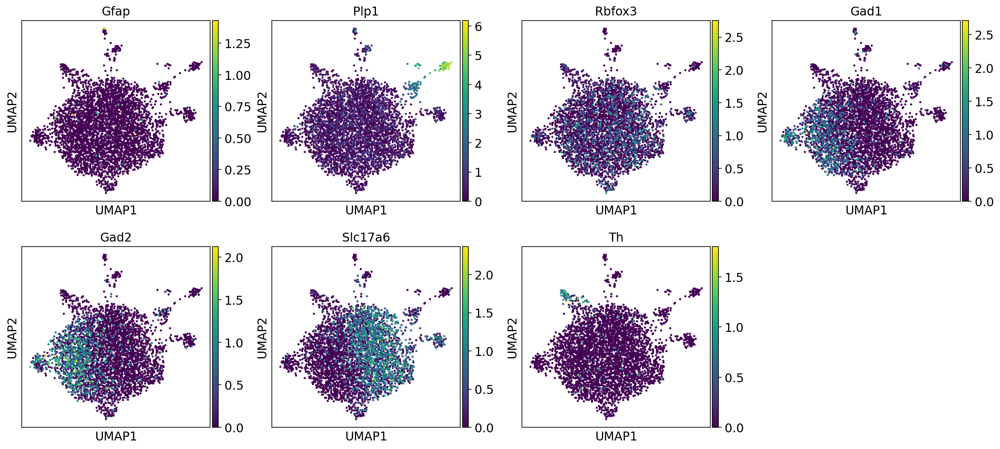

In [106]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25
                  ,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")
    else:
        sc.pl.umap(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], use_raw=True, s=25
                  ,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")

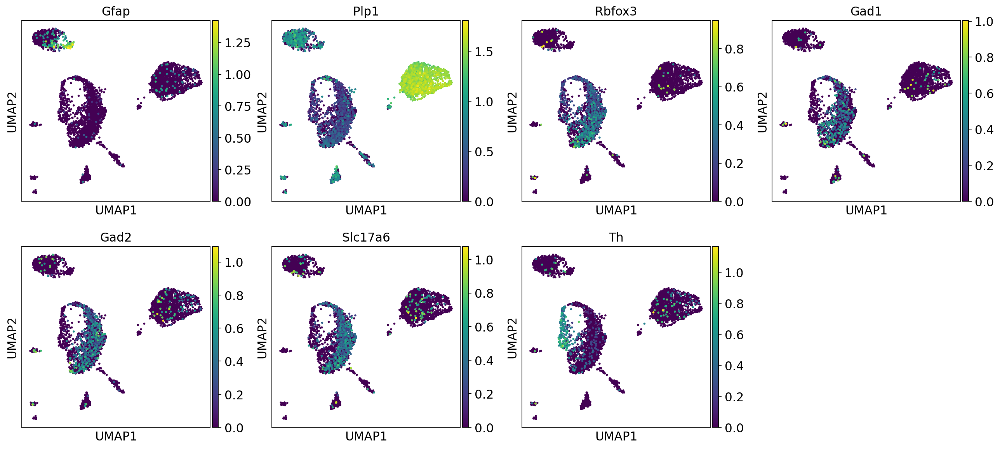

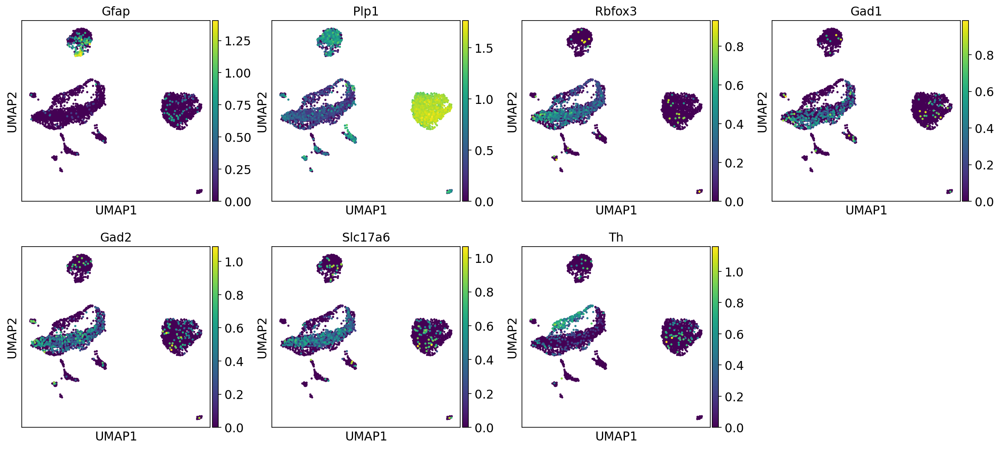

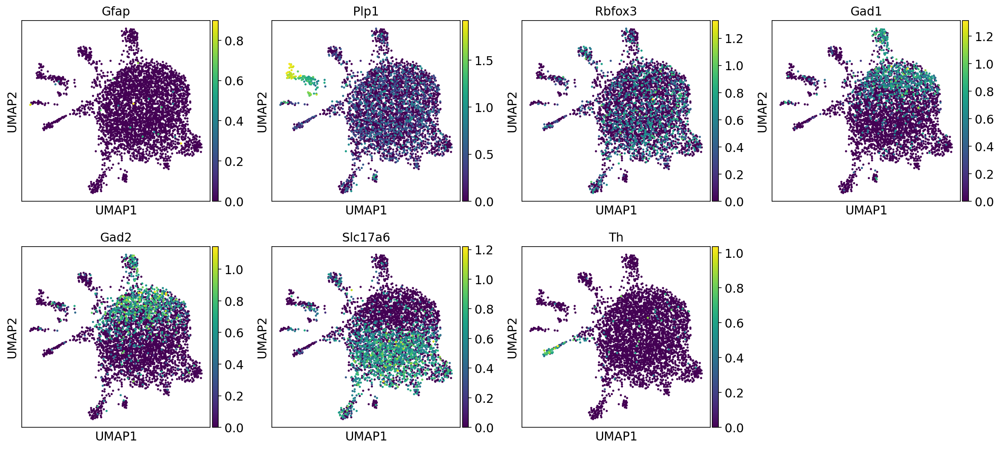

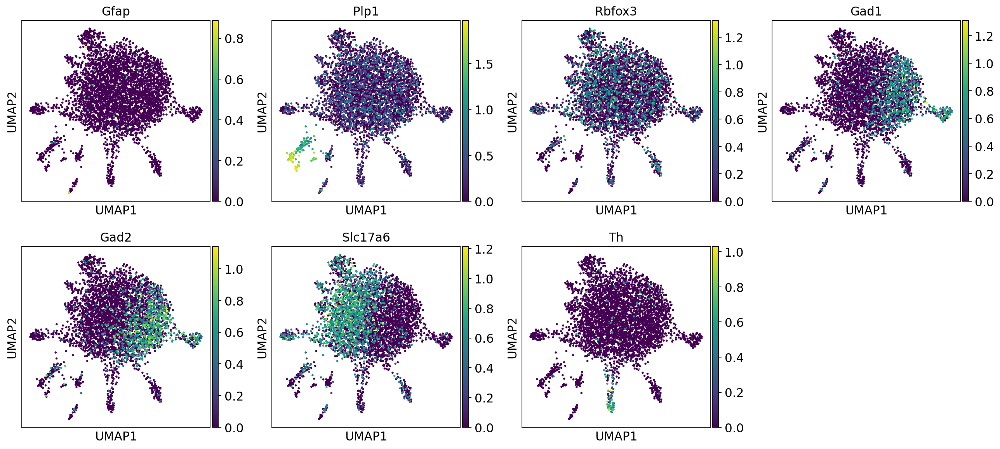

In [107]:
for i in range(numberobj):
    if locals()[object_names_reg[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25
                  ,save = "_"+object_names_reg[i]+"_umap_markers_n"+str(nn)+".pdf")
    else:
        sc.pl.umap(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], use_raw=True, s=25
                  ,save = "_"+object_names_reg[i]+"_umap_markers_n"+str(nn)+".pdf")

In [113]:
!ls figures/umap

umap_adata_hey_93_filtered_1_reg_umap_markers_n15.pdf
umap_adata_hey_93_filtered_1_reg_umap_n15.pdf
umap_adata_hey_93_filtered_1_umap_markers_n15.pdf
umap_adata_hey_93_filtered_1_umap_n15.pdf
umap_adata_hey_98_filtered_1_reg_umap_markers_n15.pdf
umap_adata_hey_98_filtered_1_reg_umap_n15.pdf
umap_adata_hey_98_filtered_1_umap_markers_n15.pdf
umap_adata_hey_98_filtered_1_umap_n15.pdf
umap_adata_zhong_93_filtered_1_reg_umap_markers_n15.pdf
umap_adata_zhong_93_filtered_1_reg_umap_n15.pdf
umap_adata_zhong_93_filtered_1_umap_markers_n15.pdf
umap_adata_zhong_93_filtered_1_umap_n15.pdf
umap_adata_zhong_98_filtered_1_reg_umap_markers_n15.pdf
umap_adata_zhong_98_filtered_1_reg_umap_n15.pdf
umap_adata_zhong_98_filtered_1_umap_markers_n15.pdf
umap_adata_zhong_98_filtered_1_umap_n15.pdf


### Save
nn =15

In [39]:
print(object_names_filtered[3][6:].split('_filtered')[0])

zhong_98_intron


In [40]:
for i in range(numberobj):
    locals()[object_names_filtered[i]].write(os.path.join('./data/'+object_names_filtered[i][6:].split('_filtered')[0])+'_f1_processed_1.h5ad')
    locals()[object_names_reg[i]].write(os.path.join('./data/'+object_names_reg[i][6:].split('_filtered')[0])+'_f1_reg_processed_1.h5ad')

In [41]:
!ls data

hey_98_f1_processed_1.h5ad	       zhong_98_f1_processed_1.h5ad
hey_98_f1_reg_processed_1.h5ad	       zhong_98_f1_reg_processed_1.h5ad
hey_98_filtered_1.h5ad		       zhong_98_filtered_1.h5ad
hey_98_intron_f1_processed_1.h5ad      zhong_98_intron_f1_processed_1.h5ad
hey_98_intron_f1_reg_processed_1.h5ad  zhong_98_intron_f1_reg_processed_1.h5ad
hey_98_intron_filtered_1.h5ad	       zhong_98_intron_filtered_1.h5ad
hey_98_intron_preprocessed.h5ad        zhong_98_intron_preprocessed.h5ad
hey_98_preprocessed.h5ad	       zhong_98_preprocessed.h5ad
